In [1]:
import pandas as pd
import datetime
from datetime import date, timedelta
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import savgol_filter
from sklearn.model_selection import TimeSeriesSplit

In [2]:
def plotsales(df,xx,yy,clr,ttle):
    fig = px.line(df, x=xx, y=yy, color=clr, hover_name=clr,
        line_shape="spline", title = ttle, render_mode="svg", width=1100, height=600)
    #fig.update_layout(xaxis=dict(rangeslider=dict(visible=True),type="linear"))
    fig.show()

### Read the data sales_processed.csv from the data folder into a pandas DataFrame and preview the first five rows.

In [3]:
data = pd.read_csv("/Zia/workflow_files/data/sales_processed.csv",index_col='date', parse_dates = True)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\3410412956.py:1: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  data = pd.read_csv("/Zia/workflow_files/data/sales_processed.csv",index_col='date', parse_dates = True)


In [4]:
data[1:5]

,store_id,cat_id,sales,rdate
date,,,,
2011-01-30,TX_1,FOODS,3844.97,30-01-2011
2011-01-31,TX_1,FOODS,2888.03,31-01-2011
2011-02-01,TX_1,FOODS,3631.28,01-02-2011
2011-02-02,TX_1,FOODS,3072.18,02-02-2011


In [5]:
sd_df = data.copy()
sd_df[1:5]

,store_id,cat_id,sales,rdate
date,,,,
2011-01-30,TX_1,FOODS,3844.97,30-01-2011
2011-01-31,TX_1,FOODS,2888.03,31-01-2011
2011-02-01,TX_1,FOODS,3631.28,01-02-2011
2011-02-02,TX_1,FOODS,3072.18,02-02-2011


### Plot line charts of the same category in a Plotly diagram. Play around with the diagrams and analyze the time series.

In [6]:
cat_grp = sd_df.groupby(['cat_id'])
cat_grp.apply(lambda x:x)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\1129422566.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cat_grp.apply(lambda x:x)


store_id     cat_id    sales       rdate
cat_id    date                                               
FOODS     2011-01-29     TX_1      FOODS  3950.35  29-01-2011
          2011-01-30     TX_1      FOODS  3844.97  30-01-2011
          2011-01-31     TX_1      FOODS  2888.03  31-01-2011
          2011-02-01     TX_1      FOODS  3631.28  01-02-2011
          2011-02-02     TX_1      FOODS  3072.18  02-02-2011
...                       ...        ...      ...         ...
HOUSEHOLD 2016-05-18     WI_3  HOUSEHOLD  2225.31  18-05-2016
          2016-05-19     WI_3  HOUSEHOLD  2468.50  19-05-2016
          2016-05-20     WI_3  HOUSEHOLD  3664.25  20-05-2016
          2016-05-21     WI_3  HOUSEHOLD  3487.02  21-05-2016
          2016-05-22     WI_3  HOUSEHOLD  3566.90  22-05-2016

[58230 rows x 4 columns]

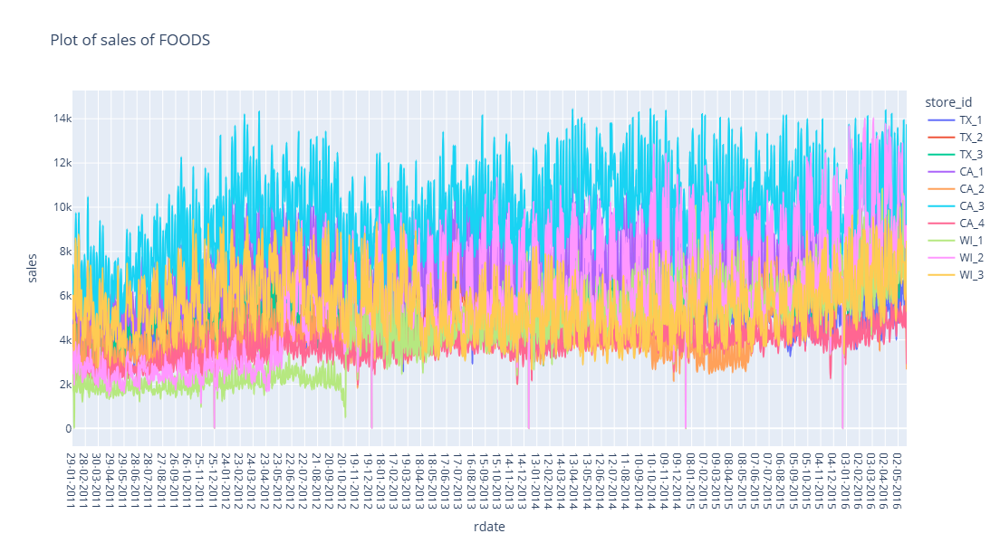

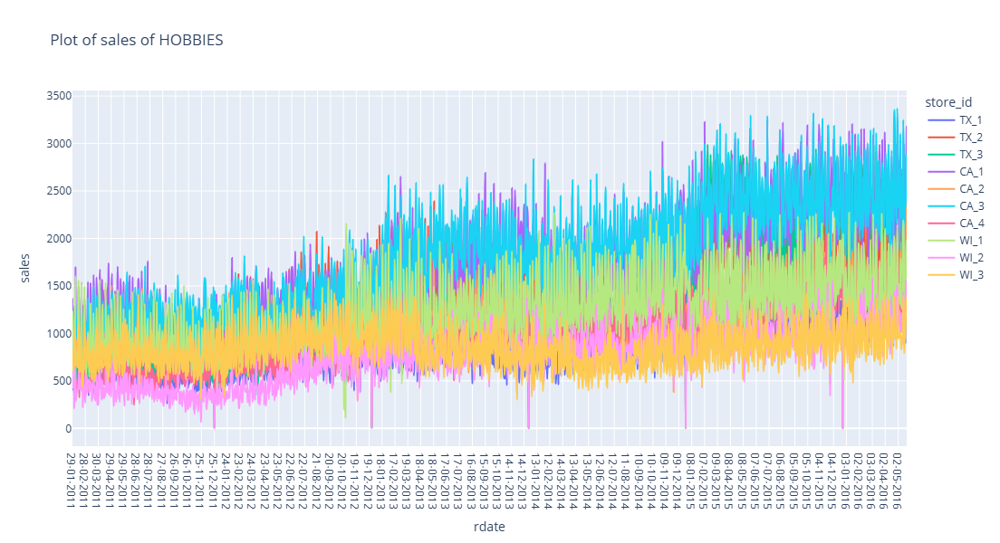

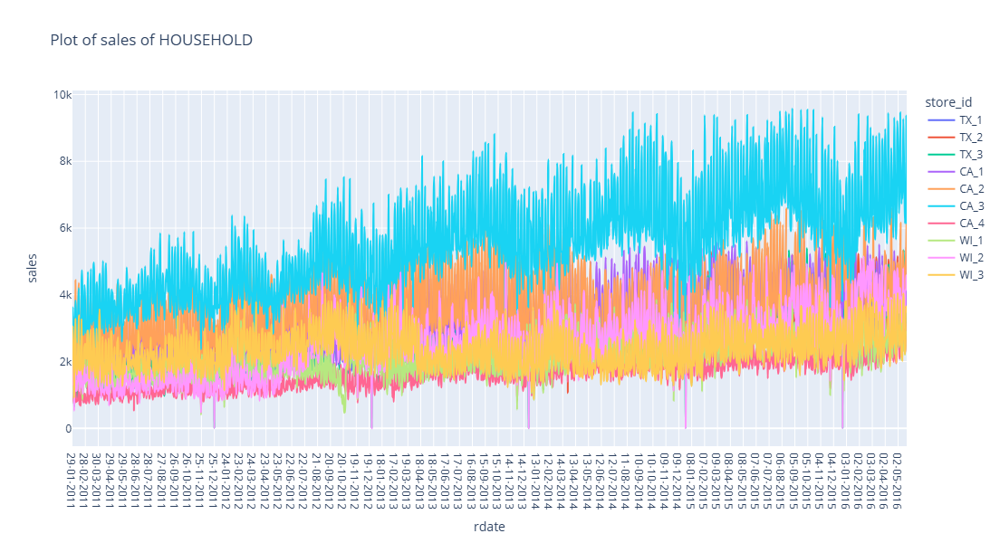

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\3032261112.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



""


In [7]:
cat_grp.apply(lambda x:plotsales(x,'rdate','sales','store_id', 'Plot of sales of '+x.cat_id.unique()[0]))


### Sales of Food
#### &emsp; General
##### &emsp;&emsp; The sales show an increasing trend accross stores
##### &emsp;&emsp; On a weekly basis, the sales dip during the middle of the week (Wed-Thu) and increase over the weekend (Sat-Sun)
#### &emsp; Store wise :-
##### &emsp;&emsp; High sales by CA_3
##### &emsp;&emsp; Low sales by CA_4
##### &emsp;&emsp; Break in data in following stores
###### &emsp;&emsp;&emsp; WI_1 on 26-Oct-2012
###### &emsp;&emsp;&emsp; WI_2 on 02-Jun-2012
### Sales of Hobbies
#### &emsp; General
##### &emsp;&emsp; The sales show an increasing trend accross stores
##### &emsp;&emsp; On a weekly basis, the sales dip during the middle of the week (Wed-Thu) and increase over the weekend (Sat-Sun)
#### &emsp; Store wise :-
##### &emsp;&emsp; High sales by CA_1 & CA_3
##### &emsp;&emsp; Low sales by WI_2
### Sales of Households
#### &emsp; General
##### &emsp;&emsp; The sales show an increasing trend accross stores
##### &emsp;&emsp; On a weekly basis, the sales dip during the middle of the week (Wed-Thu) and increase over the weekend (Sat-Sun)
#### &emsp; Store wise :-
##### &emsp;&emsp; High sales by CA_3
##### &emsp;&emsp; Low sales by CA_4

### Identify the time series with breaks in trend and remove the past data before the breaks from these time series. Save the output as sales_cleaned.csv in the data folder

#### As mentioned above, two stores with id 'WI_1' and WI_2' show break in trend on 26-Oct-2012 and 02-Jun-2012 respectively. Their data prior to these dates will be removed.

In [8]:
sd_df[((sd_df['store_id'] == 'WI_1') & (sd_df['rdate'] <= '2012-10-26')) | ((sd_df['store_id'] == 'WI_2') & (sd_df['rdate'] <= '2012-06-02'))]

,store_id,cat_id,sales,rdate
date,,,,
2011-02-01,WI_1,FOODS,1602.99,01-02-2011
2011-02-02,WI_1,FOODS,2.96,02-02-2011
2011-02-03,WI_1,FOODS,2303.27,03-02-2011
2011-02-04,WI_1,FOODS,2927.95,04-02-2011
2011-02-05,WI_1,FOODS,3534.08,05-02-2011
...,...,...,...,...
2016-05-16,WI_2,HOUSEHOLD,2999.07,16-05-2016
2016-05-17,WI_2,HOUSEHOLD,3264.44,17-05-2016
2016-05-18,WI_2,HOUSEHOLD,3317.22,18-05-2016


In [ ]:
#data[((data['store_id'] == 'WI_1') & (data['rdate'] <= '2012-10-26')) | ((data['store_id'] == 'WI_2') & (data['rdate'] <= '2012-06-02'))]

In [9]:
newdata = sd_df.reset_index()
newdata

,date,store_id,cat_id,sales,rdate
0,2011-01-29,TX_1,FOODS,3950.35,29-01-2011
1,2011-01-30,TX_1,FOODS,3844.97,30-01-2011
2,2011-01-31,TX_1,FOODS,2888.03,31-01-2011
3,2011-02-01,TX_1,FOODS,3631.28,01-02-2011
4,2011-02-02,TX_1,FOODS,3072.18,02-02-2011
...,...,...,...,...,...
58225,2016-05-18,WI_3,HOUSEHOLD,2225.31,18-05-2016
58226,2016-05-19,WI_3,HOUSEHOLD,2468.50,19-05-2016
58227,2016-05-20,WI_3,HOUSEHOLD,3664.25,20-05-2016
58228,2016-05-21,WI_3,HOUSEHOLD,3487.02,21-05-2016


In [10]:
index_names = newdata[((newdata['store_id'] == 'WI_1') & (newdata['rdate'] <= '2012-10-26')) | ((newdata['store_id'] == 'WI_2') & (newdata['rdate'] <= '2012-06-02'))].index
index_names

Index([40764, 40765, 40766, 40767, 40768, 40769, 40770, 40771, 40772, 40773,
       ...
       52395, 52396, 52397, 52398, 52399, 52400, 52401, 52402, 52403, 52404],
      dtype='int64', length=7680)

In [11]:
newdata.drop(index_names, inplace = True) 

In [12]:
newdata

,date,store_id,cat_id,sales,rdate
0,2011-01-29,TX_1,FOODS,3950.35,29-01-2011
1,2011-01-30,TX_1,FOODS,3844.97,30-01-2011
2,2011-01-31,TX_1,FOODS,2888.03,31-01-2011
3,2011-02-01,TX_1,FOODS,3631.28,01-02-2011
4,2011-02-02,TX_1,FOODS,3072.18,02-02-2011
...,...,...,...,...,...
58225,2016-05-18,WI_3,HOUSEHOLD,2225.31,18-05-2016
58226,2016-05-19,WI_3,HOUSEHOLD,2468.50,19-05-2016
58227,2016-05-20,WI_3,HOUSEHOLD,3664.25,20-05-2016
58228,2016-05-21,WI_3,HOUSEHOLD,3487.02,21-05-2016


In [13]:
newdata.to_csv('sales_cleaned.csv', index=False)

### Choose a random store_id and cat_id to plot the box plots and line charts of the sales by weekday, day of month, and month separately.

#### lets plot for 'TX_3' and 'FOODS'

##### Get data for 'TX_3' and 'FOODS'

In [14]:
smpdt =  newdata[(newdata['store_id'] == 'TX_3') & (newdata['cat_id'] == 'FOODS')].copy()
smpdt

,date,store_id,cat_id,sales,rdate
11646,2011-01-29,TX_3,FOODS,4681.27,29-01-2011
11647,2011-01-30,TX_3,FOODS,4625.89,30-01-2011
11648,2011-01-31,TX_3,FOODS,3493.71,31-01-2011
11649,2011-02-01,TX_3,FOODS,3705.31,01-02-2011
11650,2011-02-02,TX_3,FOODS,2925.76,02-02-2011
...,...,...,...,...,...
13582,2016-05-18,TX_3,FOODS,6513.29,18-05-2016
13583,2016-05-19,TX_3,FOODS,6275.03,19-05-2016
13584,2016-05-20,TX_3,FOODS,7326.73,20-05-2016
13585,2016-05-21,TX_3,FOODS,8160.63,21-05-2016


In [15]:
smpdt['rdate'] = pd.to_datetime(smpdt['rdate'])

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\1845826947.py:1: UserWarning:

Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [16]:
smpdt['day_name'] = smpdt['rdate'].dt.day_name()

In [17]:
smpdt['day'] = smpdt['rdate'].dt.dayofweek

In [18]:
smpdt['mth_Day'] = smpdt['rdate'].dt.strftime("%d")

In [19]:
smpdt['mth_Day'] = pd.to_numeric(smpdt['mth_Day'], downcast='integer', errors='coerce')

In [20]:
smpdt['month'] = smpdt['rdate'].dt.month

In [21]:
smpdt['year'] = smpdt['rdate'].dt.year

<Axes: >

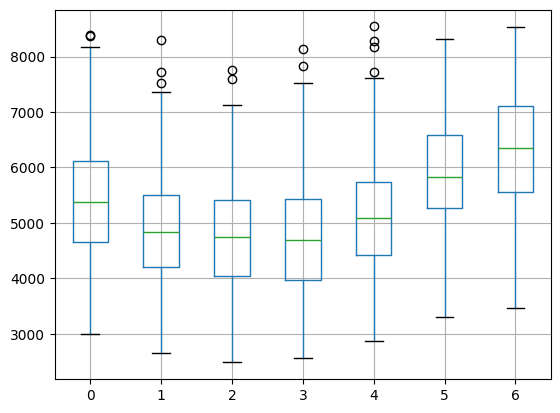

In [22]:
x =smpdt.pivot(columns=['day'], values='sales')
x.boxplot()

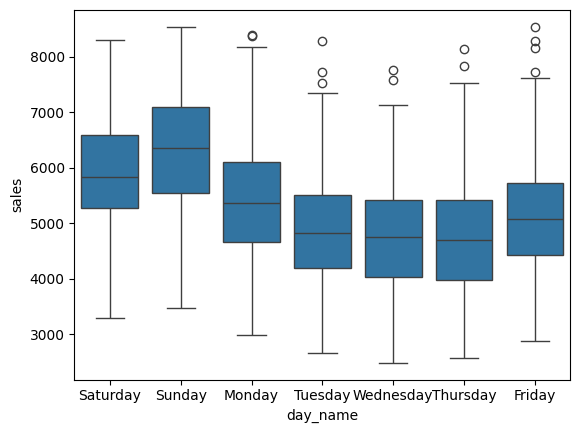

In [23]:
sns.boxplot(x='day_name', y='sales', data=smpdt)

plt.show()

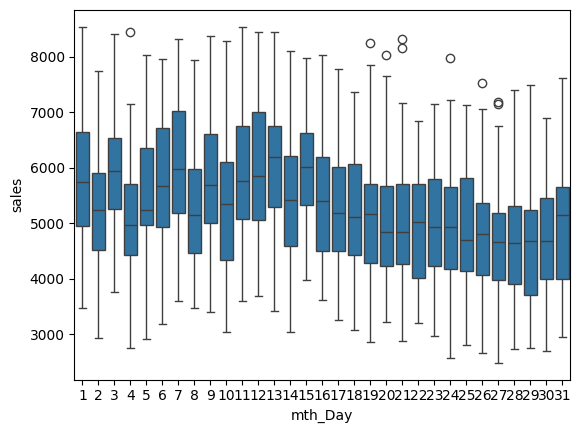

In [24]:
sns.boxplot(x='mth_Day', y='sales', data=smpdt)

plt.show()

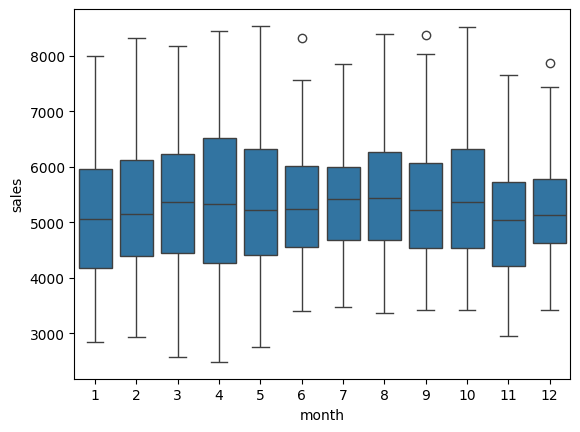

In [25]:
sns.boxplot(x='month', y='sales', data=smpdt)

plt.show()

In [26]:
datgrp = smpdt.groupby(['year','day'])['sales'].mean()
datgrp

year  day
2011  0      4435.218125
      1      3982.788958
      2      3928.336042
      3      3885.916875
      4      4218.445417
      5      5066.465306
      6      5492.868438
2012  0      4958.510755
      1      4487.235192
      2      4421.274615
      3      4357.248077
      4      4815.576731
      5      5635.343269
      6      6050.249811
2013  0      4852.906923
      1      4462.793774
      2      4297.270577
      3      4250.884808
      4      4630.727692
      5      5351.111538
      6      5682.725385
2014  0      5829.921923
      1      5181.424038
      2      5158.401132
      3      5095.590481
      4      5489.715192
      5      6318.544615
      6      6729.503462
2015  0      6335.692596
      1      5733.367308
      2      5596.139231
      3      5703.188868
      4      5906.047404
      5      6656.664423
      6      7120.446827
2016  0      6873.111000
      1      6520.649500
      2      6184.554500
      3      6367.692000
      4      65

In [27]:
datgrp.apply(lambda x:x)

year  day
2011  0      4435.218125
      1      3982.788958
      2      3928.336042
      3      3885.916875
      4      4218.445417
      5      5066.465306
      6      5492.868438
2012  0      4958.510755
      1      4487.235192
      2      4421.274615
      3      4357.248077
      4      4815.576731
      5      5635.343269
      6      6050.249811
2013  0      4852.906923
      1      4462.793774
      2      4297.270577
      3      4250.884808
      4      4630.727692
      5      5351.111538
      6      5682.725385
2014  0      5829.921923
      1      5181.424038
      2      5158.401132
      3      5095.590481
      4      5489.715192
      5      6318.544615
      6      6729.503462
2015  0      6335.692596
      1      5733.367308
      2      5596.139231
      3      5703.188868
      4      5906.047404
      5      6656.664423
      6      7120.446827
2016  0      6873.111000
      1      6520.649500
      2      6184.554500
      3      6367.692000
      4      65

In [28]:
datgrp.index

MultiIndex([(2011, 0),
            (2011, 1),
            (2011, 2),
            (2011, 3),
            (2011, 4),
            (2011, 5),
            (2011, 6),
            (2012, 0),
            (2012, 1),
            (2012, 2),
            (2012, 3),
            (2012, 4),
            (2012, 5),
            (2012, 6),
            (2013, 0),
            (2013, 1),
            (2013, 2),
            (2013, 3),
            (2013, 4),
            (2013, 5),
            (2013, 6),
            (2014, 0),
            (2014, 1),
            (2014, 2),
            (2014, 3),
            (2014, 4),
            (2014, 5),
            (2014, 6),
            (2015, 0),
            (2015, 1),
            (2015, 2),
            (2015, 3),
            (2015, 4),
            (2015, 5),
            (2015, 6),
            (2016, 0),
            (2016, 1),
            (2016, 2),
            (2016, 3),
            (2016, 4),
            (2016, 5),
            (2016, 6)],
           names=['year', 'day'])

In [29]:
df = datgrp.to_frame()
df

sales
year day             
2011 0    4435.218125
     1    3982.788958
     2    3928.336042
     3    3885.916875
     4    4218.445417
     5    5066.465306
     6    5492.868438
2012 0    4958.510755
     1    4487.235192
     2    4421.274615
     3    4357.248077
     4    4815.576731
     5    5635.343269
     6    6050.249811
2013 0    4852.906923
     1    4462.793774
     2    4297.270577
     3    4250.884808
     4    4630.727692
     5    5351.111538
     6    5682.725385
2014 0    5829.921923
     1    5181.424038
     2    5158.401132
     3    5095.590481
     4    5489.715192
     5    6318.544615
     6    6729.503462
2015 0    6335.692596
     1    5733.367308
     2    5596.139231
     3    5703.188868
     4    5906.047404
     5    6656.664423
     6    7120.446827
2016 0    6873.111000
     1    6520.649500
     2    6184.554500
     3    6367.692000
     4    6591.151905
     5    7152.934524
     6    7414.394286

In [30]:
df = df.reset_index(level = ['year', 'day'])

In [31]:
df

,year,day,sales
0,2011,0,4435.218125
1,2011,1,3982.788958
2,2011,2,3928.336042
3,2011,3,3885.916875
4,2011,4,4218.445417
5,2011,5,5066.465306
6,2011,6,5492.868438
7,2012,0,4958.510755
8,2012,1,4487.235192
9,2012,2,4421.274615


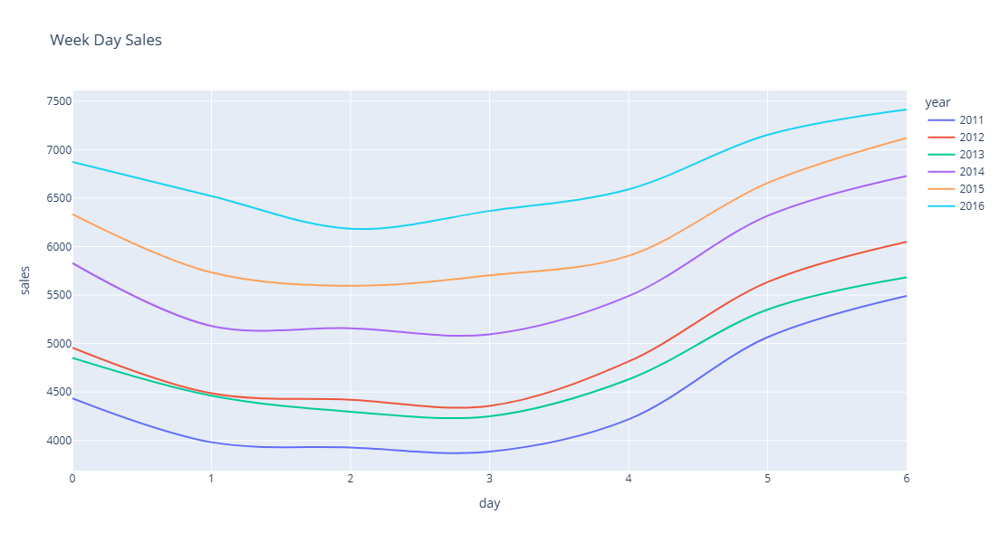

In [32]:
fig = px.line(df, x='day', y='sales', color='year', hover_name='year',
        line_shape="spline", title = 'Week Day Sales', render_mode="svg", width=1100, height=600)
    #fig.update_layout(xaxis=dict(rangeslider=dict(visible=True),type="linear"))
fig.show()

#### Analysis: Sales tend to increase on Friday, peak at weekend, start decreasing on Monday and bottom out in mid-week mostly Thurday

In [33]:
datgrp = smpdt.groupby(['year','mth_Day'])['sales'].mean()
datgrp

year  mth_Day
2011  1          4743.400909
      2          4166.020909
      3          5025.261818
      4          4224.306364
      5          4674.543636
                    ...     
2016  27         5965.697500
      28         6369.072500
      29         5943.775000
      30         6111.876667
      31         6411.695000
Name: sales, Length: 186, dtype: float64

In [34]:
df = datgrp.to_frame()
df

sales
year mth_Day             
2011 1        4743.400909
     2        4166.020909
     3        5025.261818
     4        4224.306364
     5        4674.543636
...                   ...
2016 27       5965.697500
     28       6369.072500
     29       5943.775000
     30       6111.876667
     31       6411.695000

[186 rows x 1 columns]

In [35]:
df = df.reset_index(level = ['year', 'mth_Day'])
df

,year,mth_Day,sales
0,2011,1,4743.400909
1,2011,2,4166.020909
2,2011,3,5025.261818
3,2011,4,4224.306364
4,2011,5,4674.543636
...,...,...,...
181,2016,27,5965.697500
182,2016,28,6369.072500
183,2016,29,5943.775000
184,2016,30,6111.876667


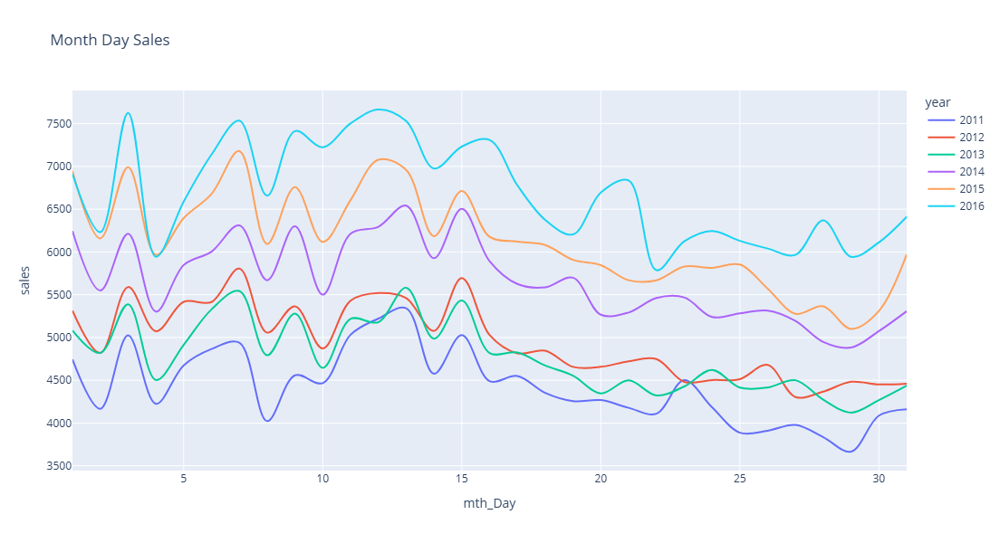

In [36]:
fig = px.line(df, x='mth_Day', y='sales', color='year', hover_name='year',
        line_shape="spline", title = 'Month Day Sales', render_mode="svg", width=1100, height=600)
    #fig.update_layout(xaxis=dict(rangeslider=dict(visible=True),type="linear"))
fig.show()

#### Analysis: Spike in sales in the middle of the month followed by downward trend in the rest of the month

In [37]:
datgrp = smpdt.groupby(['year','month'])['sales'].mean()
datgrp

year  month
2011  1        4266.956667
      2        3959.571786
      3        3740.476452
      4        3692.660667
      5        3692.042581
                  ...     
2016  1        6380.215161
      2        6717.704483
      3        6648.709355
      4        6810.593333
      5        7282.742955
Name: sales, Length: 65, dtype: float64

In [38]:
df = datgrp.to_frame()
df

sales
year month             
2011 1      4266.956667
     2      3959.571786
     3      3740.476452
     4      3692.660667
     5      3692.042581
...                 ...
2016 1      6380.215161
     2      6717.704483
     3      6648.709355
     4      6810.593333
     5      7282.742955

[65 rows x 1 columns]

In [39]:
df = df.reset_index(level = ['year', 'month'])
df

,year,month,sales
0,2011,1,4266.956667
1,2011,2,3959.571786
2,2011,3,3740.476452
3,2011,4,3692.660667
4,2011,5,3692.042581
...,...,...,...
60,2016,1,6380.215161
61,2016,2,6717.704483
62,2016,3,6648.709355
63,2016,4,6810.593333


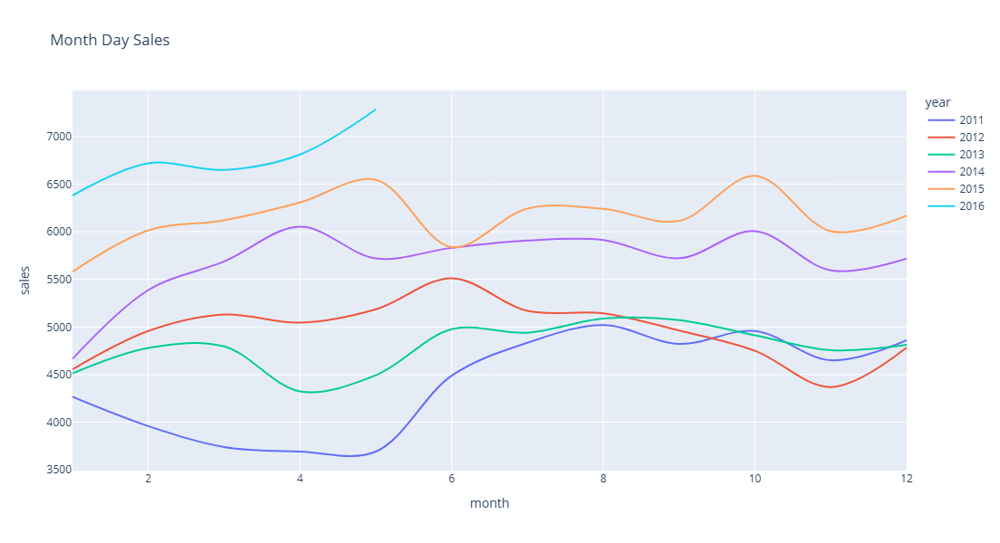

In [40]:
fig = px.line(df, x='month', y='sales', color='year', hover_name='year',
        line_shape="spline", title = 'Month Day Sales', render_mode="svg", width=1100, height=600)
    #fig.update_layout(xaxis=dict(rangeslider=dict(visible=True),type="linear"))
fig.show()

#### Analysis: No visible monthly trend.

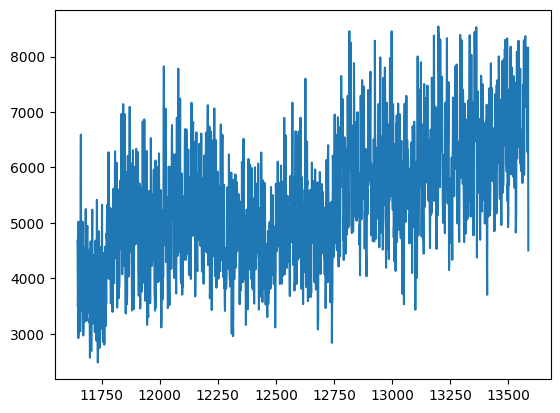

In [41]:
smpdt['sales'].plot()
plt.show()

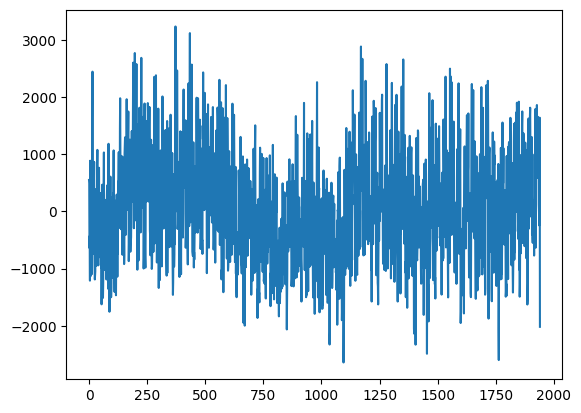

In [42]:
data_detrended = signal.detrend(smpdt['sales'].values)

plt.plot(data_detrended)
plt.show()

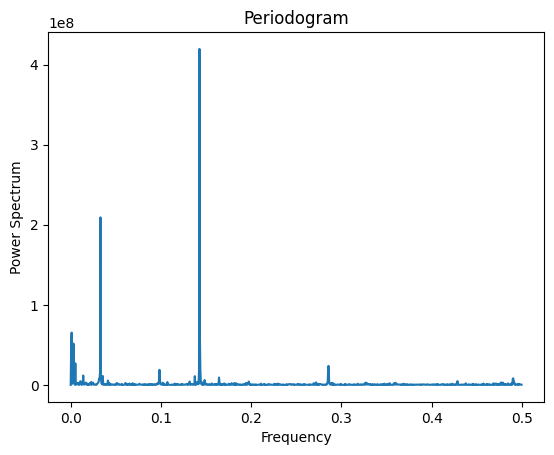

In [44]:
f, Periodogram = signal.periodogram(data_detrended)
plt.plot(f, Periodogram)
plt.title("Periodogram")
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.show()

In [45]:
# Make dataframe for finding frequency with highest power spectrum
data = {'interval':1/f, 'power_spectral_density':Periodogram}
df_periodogram = pd.DataFrame(data = data)
df_periodogram.sort_values(by=['power_spectral_density'], ascending=False, inplace=True)
df_periodogram

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\1848974955.py:2: RuntimeWarning:

divide by zero encountered in divide



,interval,power_spectral_density
277,7.007220,4.195055e+08
64,30.328125,2.091736e+08
2,970.500000,6.529500e+07
278,6.982014,5.928751e+07
6,323.500000,5.158400e+07
...,...,...
327,5.935780,6.160509e+02
37,52.459459,4.945430e+02
548,3.541971,3.145905e+02
867,2.238754,2.412418e+02


In [ ]:
newdata

In [43]:
def detrend_series(store, category):
    """
    Detrend the sales of a time series and return the detrended sales value, 
    the trend identified, and the original sales 
    """
    # print(newdata)
    smpdt =  newdata[(newdata['store_id'] == store) & (newdata['cat_id'] == category)].copy()
    # print(smpdt)
    data_detrended = signal.detrend(smpdt['sales'].values)

    return data_detrended

def summarise_periodicity(data_detrended):
    """
    Extract important frequency values with periodogram
    """
    f, Periodogram = signal.periodogram(data_detrended)
    data = {'interval':1/f, 'power_spectral_density':Periodogram}
    df_periodogram = pd.DataFrame(data = data)
    df_periodogram.sort_values(by=['power_spectral_density'], ascending=False, inplace=True)
    
    return df_periodogram

def plot_periodicity(data_detrended):
    """
    Plot periodogram
    """
    f, Periodogram = signal.periodogram(data_detrended)
    plt.plot(f, Periodogram)
    plt.title("Periodogram")
    plt.xlabel('Frequency')
    plt.ylabel('Power Spectrum')
    plt.show()
    

#### 'FOODS' category anaylysis

##### Lets check for stores 'TX_3', 'CA_4' & 'WI_3'

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



       interval  power_spectral_density
277    7.007220            4.195055e+08
64    30.328125            2.091736e+08
2    970.500000            6.529500e+07
278    6.982014            5.928751e+07
6    323.500000            5.158400e+07
..          ...                     ...
327    5.935780            6.160509e+02
37    52.459459            4.945430e+02
548    3.541971            3.145905e+02
867    2.238754            2.412418e+02
0           inf            3.584023e-25

[971 rows x 2 columns]


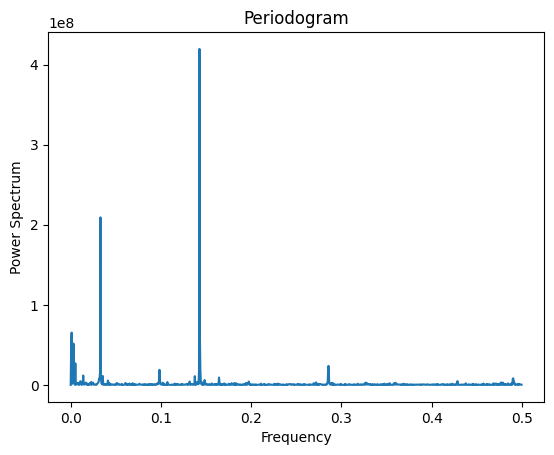

In [46]:
data_detrended = detrend_series('TX_3', 'FOODS')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



        interval  power_spectral_density
277     7.007220            1.998891e+08
1    1941.000000            2.837824e+07
4     485.250000            2.542749e+07
278     6.982014            2.324952e+07
64     30.328125            1.699668e+07
..           ...                     ...
514     3.776265            3.955058e+02
810     2.396296            3.738930e+02
504     3.851190            3.669978e+02
884     2.195701            1.892808e+02
0            inf            3.584023e-25

[971 rows x 2 columns]


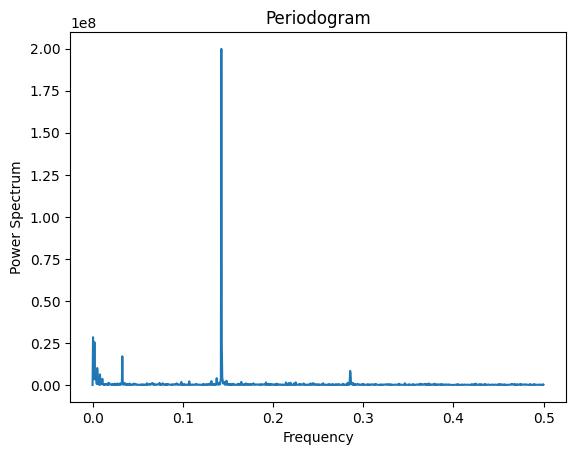

In [47]:
data_detrended = detrend_series('CA_4', 'FOODS')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



        interval  power_spectral_density
64     30.328125            8.800283e+08
277     7.007220            5.898556e+08
1    1941.000000            3.693097e+08
3     647.000000            1.611498e+08
5     388.200000            1.326527e+08
..           ...                     ...
151    12.854305            1.801519e+03
660     2.940909            1.029390e+03
135    14.377778            9.650678e+02
630     3.080952            7.986072e+02
0            inf            3.375630e-24

[971 rows x 2 columns]


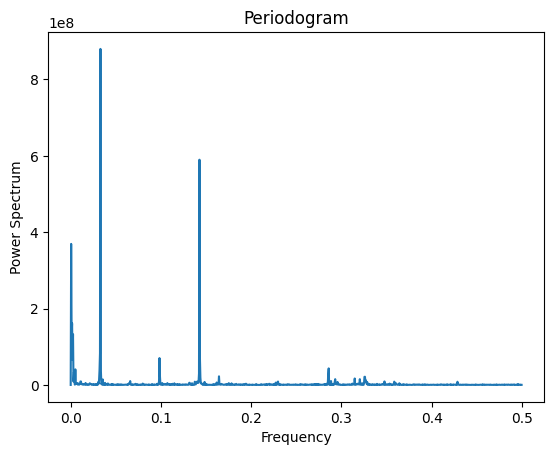

In [48]:
data_detrended = detrend_series('WI_3', 'FOODS')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

#

#### As it can be seen in the above periodograms and periodicity summary, the 'FOODS' category exhibits weekly and monthly seasonality.

#

#### 'HOUSEHOLD' category anaylysis

##### Lets check for stores 'TX_3', 'CA_4' & 'WI_3'

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



        interval  power_spectral_density
277     7.007220            2.279261e+08
2     970.500000            4.882963e+07
1    1941.000000            3.279864e+07
278     6.982014            2.848333e+07
64     30.328125            1.196193e+07
..           ...                     ...
339     5.725664            4.232933e+02
9     215.666667            3.651864e+02
764     2.540576            1.586938e+02
196     9.903061            8.091268e+01
0            inf            1.879375e-25

[971 rows x 2 columns]


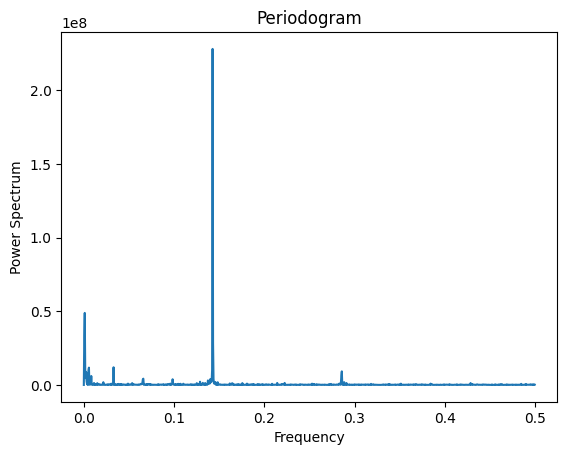

In [49]:
data_detrended = detrend_series('WI_3', 'HOUSEHOLD')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

       interval  power_spectral_density
277    7.007220            2.229408e+08
278    6.982014            4.074504e+07
11   176.454545            1.342495e+07
555    3.497297            1.231807e+07
6    323.500000            1.161510e+07
..          ...                     ...
329    5.899696            1.308644e+03
887    2.188275            1.272345e+03
103   18.844660            1.242374e+03
221    8.782805            1.079274e+03
0           inf            1.704648e-25

[971 rows x 2 columns]


C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



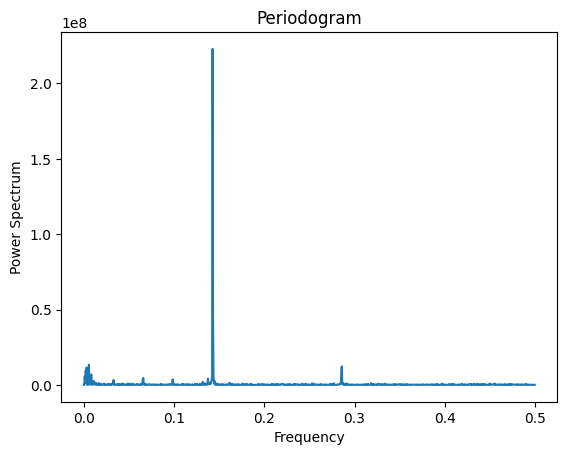

In [50]:
data_detrended = detrend_series('TX_3', 'HOUSEHOLD')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



       interval  power_spectral_density
277    7.007220            4.309518e+07
278    6.982014            5.392632e+06
6    323.500000            4.748775e+06
5    388.200000            3.184124e+06
555    3.497297            3.105112e+06
..          ...                     ...
589    3.295416            5.562553e+02
307    6.322476            4.976146e+02
628    3.090764            4.950210e+02
892    2.176009            4.410627e+02
0           inf            4.924836e-26

[971 rows x 2 columns]


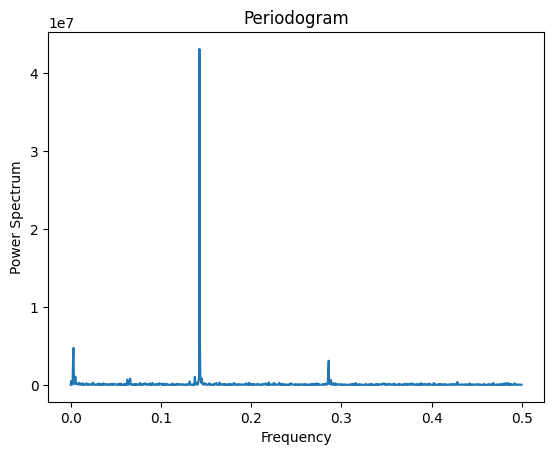

In [51]:
data_detrended = detrend_series('CA_4', 'HOUSEHOLD')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

#

#### As it can be seen in the above periodograms and periodicity summary, the 'HOUSEHOLD' category exhibits weekly seasonality.

# 

#### 'HOBBIES' category anaylysis

##### Lets check for stores 'TX_2', 'CA_2' & 'WI_1'

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



       interval  power_spectral_density
277    7.007220            1.564032e+07
2    970.500000            5.869891e+06
555    3.497297            2.653219e+06
278    6.982014            2.510694e+06
5    388.200000            2.409253e+06
..          ...                     ...
397    4.889169            1.402480e+02
449    4.322940            8.177163e+01
482    4.026971            5.962136e+01
384    5.054687            1.871653e+01
0           inf            9.115208e-26

[971 rows x 2 columns]


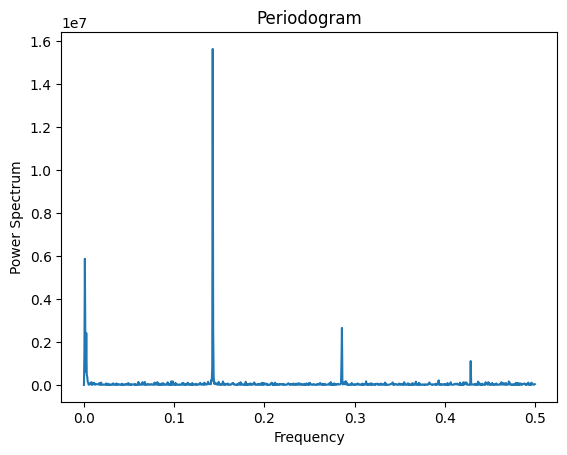

In [52]:
data_detrended = detrend_series('TX_1', 'HOBBIES')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



       interval  power_spectral_density
277    7.007220            3.487920e+07
2    970.500000            1.203366e+07
278    6.982014            6.652707e+06
555    3.497297            4.480123e+06
554    3.503610            2.313405e+06
..          ...                     ...
686    2.829446            8.703379e+01
638    3.042320            4.688692e+01
152   12.769737            4.261912e+01
689    2.817126            8.944713e+00
0           inf            2.727437e-26

[971 rows x 2 columns]


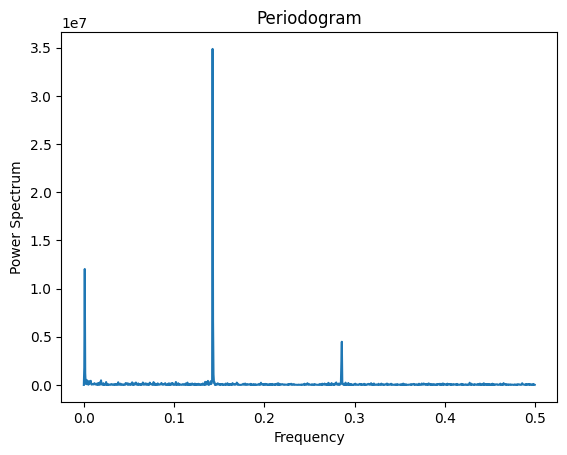

In [53]:
data_detrended = detrend_series('CA_2', 'HOBBIES')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

C:\Users\Ziauddin Syed\AppData\Local\Temp\ipykernel_26356\150077242.py:18: RuntimeWarning:

divide by zero encountered in divide



      interval  power_spectral_density
85    7.776471            1.740894e+07
86    7.686047            4.369659e+06
171   3.865497            3.267468e+06
234   2.824786            1.454935e+06
149   4.436242            1.051206e+06
..         ...                     ...
304   2.174342            2.504448e+03
217   3.046083            1.259402e+03
19   34.789474            8.026237e+02
223   2.964126            1.564580e+02
0          inf            2.815668e-27

[331 rows x 2 columns]


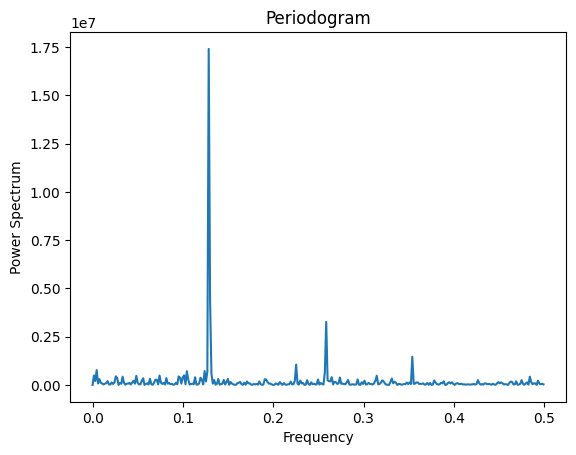

In [54]:
data_detrended = detrend_series('WI_1', 'HOBBIES')
df_periodogram = summarise_periodicity(data_detrended)
print(df_periodogram)
plot_periodicity(data_detrended)

#

#### As it can be seen in the above periodograms and periodicity summary, the 'HOBBIES' category exhibits weekly seasonality.

# 

### Code a function that implements a train-test split given a cross-validation split number and returns the split’s training, validation, and test data. Since we are required to forecast for the next 28 days, we can set 28 days as the period for test and validation data.

In [68]:
def get_cv_split(df, split_num, prediction_length=28, validation=True):
    """
    Implement train-test split given a cv split number and return training, val and test data
    """
    df['rdate'] = pd.to_datetime(df['rdate'])
    
    strlst = df['store_id'].unique()
    catlst = df['cat_id'].unique()
        
    test_list = []
    validation_list = []
    training_list = []
    
    for store in strlst:
        for catg in catlst:
            dfint = df[(df['store_id'] == store) & (df['cat_id'] == catg)]
            #print(dfint)
            max_date = dfint.rdate.max()
            min_date = dfint.rdate.min()
            tot_days = (max_date-min_date).days
            if tot_days > dfint.shape[0]:
                tot_days = dfint.shape[0]
            valtst = prediction_length
            if validation:
                valtst += prediction_length
            nsplits = int(tot_days/valtst)

            if split_num >= nsplits:
                print("******** split_num = ",split_num," too high for (", store, ", ", catg,") with number of rows = ",dfint.shape[0], " and prediction_length = ", prediction_length," ********")
                continue;
            print(store, ", ", catg, ", ", max_date,", ",min_date, ", ", tot_days, ", ", valtst, ", ", nsplits, ", ", dfint.shape)
    
            tscv = TimeSeriesSplit(n_splits=nsplits, test_size=prediction_length)
            Z = list(enumerate(tscv.split(dfint)))
            #print(Z[0][1][1], type(Z[0][1][1]))
            #print(dfint.iloc[list(Z[split_num][1][1])])
    
            ftrn_ind = list(Z[split_num][1][0])
            trn_ind = []
            val_ind = []
            if (validation):
                val_ind = ftrn_ind[-prediction_length:]
                trn_ind = list(set(ftrn_ind).difference(val_ind))
            else:
                trn_ind = ftrn_ind
            tst_ind = list(Z[split_num][1][1])
    
            tstdat = dfint.iloc[tst_ind]
            test_list.append(tstdat)
            valdat = dfint.iloc[val_ind]
            validation_list.append(valdat)
            trndat = dfint.iloc[trn_ind]
            training_list.append(trndat)
    
            print(f"Test data is from {tstdat.rdate.min()} to {tstdat.rdate.max()}")
            print(f"Validation data is from {valdat.rdate.min()} to {valdat.rdate.max()}")
            print(f"Training data is till {trndat.rdate.max()}")

            print(f"Test data consists of {len(tstdat)} days")
            print(f"Validation data consists of {len(valdat)} days")

    test_df = pd.concat(test_list)
    validation_df = pd.concat(validation_list)
    training_df = pd.concat(training_list)


    return training_df, validation_df, test_df

In [69]:
training_df, validation_df, test_df = get_cv_split(newdata,11)

TX_1 ,  FOODS ,  2016-05-22 00:00:00 ,  2011-01-29 00:00:00 ,  1940 ,  56 ,  34 ,  (1941, 5)
Test data is from 2014-08-18 00:00:00 to 2014-09-14 00:00:00
Validation data is from 2014-07-21 00:00:00 to 2014-08-17 00:00:00
Training data is till 2014-07-20 00:00:00
Test data consists of 28 days
Validation data consists of 28 days
TX_1 ,  HOBBIES ,  2016-05-22 00:00:00 ,  2011-01-29 00:00:00 ,  1940 ,  56 ,  34 ,  (1941, 5)
Test data is from 2014-08-18 00:00:00 to 2014-09-14 00:00:00
Validation data is from 2014-07-21 00:00:00 to 2014-08-17 00:00:00
Training data is till 2014-07-20 00:00:00
Test data consists of 28 days
Validation data consists of 28 days
TX_1 ,  HOUSEHOLD ,  2016-05-22 00:00:00 ,  2011-01-29 00:00:00 ,  1940 ,  56 ,  34 ,  (1941, 5)
Test data is from 2014-08-18 00:00:00 to 2014-09-14 00:00:00
Validation data is from 2014-07-21 00:00:00 to 2014-08-17 00:00:00
Training data is till 2014-07-20 00:00:00
Test data consists of 28 days
Validation data consists of 28 days
TX_2 , 

### The above output of the test run of get_cv_split() we can see that there are no overlap of dates and in each case the test and validation set have 28 days data